In [1]:
import os.path as osp
import sys
cur_dir = osp.dirname(osp.abspath(''))
PROJ_ROOT = osp.normpath(osp.join(cur_dir))
sys.path.insert(0, PROJ_ROOT)
print(PROJ_ROOT)

from core.gdrn_modeling.demo.predictor_yolo import YoloPredictor
from core.gdrn_modeling.demo.predictor_gdrn import GdrnPredictor

import os

import cv2
import matplotlib.pyplot as plt

/home/meuli/gdrn_wkspc/gdrnpp_bop2022


/home/meuli/gdrn_wkspc/.venv/lib/python3.8/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


You requested to import horovod which is missing or not supported for your OS.
[2023-11-08 16:09:08,549] [INFO] [real_accelerator.py:158:get_accelerator] Setting ds_accelerator to cuda (auto detect)


/home/meuli/gdrn_wkspc/gdrnpp_bop2022/lib/pysixd/misc.py:586: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def get_obj_im_c(K, t):
/home/meuli/gdrn_wkspc/gdrnpp_bop2022/lib/pysixd/misc.py:765: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def compute_2d_bbox_xyxy_from_pose(points, pose, K, width=640, height=480, clip=False):
/home/meuli/gdrn_wkspc/gdrnpp_bop202

vispy uses app: egl, gl: gl2


In [ ]:
# Get all class names from classes.txt
classes = [line.rstrip() for line in open(cur_dir + "/classes.txt")]

# Split and Rectify Images

In [3]:
from stereo_rectify_images import StereoImageRectifier

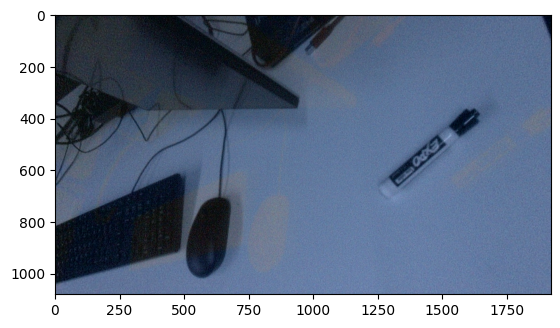

In [49]:
calib_file = cur_dir + '/unity_webcam_demo' + '/SN12398_calib_stereo.json'

# Alpha = 0 crops rectified images
img_rectifier = StereoImageRectifier(calib_file, alpha=0.0, resolution_multiplier=1.0, aspect_preserve=2.0)

img = cv2.imread("inogeni_captures/marker_5_no_light.jpg")
(img_right, img_left) = img_rectifier.split_and_rectify_stereo_image(img)

In [5]:
yolo_predictor = YoloPredictor(
                    exp_name="yolox-x",
                    config_file_path=osp.join(PROJ_ROOT,"configs/yolox/bop_pbr/yolox_x_640_augCozyAAEhsv_ranger_30_epochs_ycbv_pbr_ycbv_bop_test.py"),
                    ckpt_file_path=osp.join(PROJ_ROOT,"output/yolox/model_final.pth"),
                    fuse=True,
                    fp16=False
                    )

[1108_160918 det.yolox.engine.yolox_setup@99]: Rank of current process: 0. World size: 1
[1108_160919 det.yolox.engine.yolox_setup@100]: Environment info:
-------------------------------  ----------------------------------------------------------------------------------
sys.platform                     linux
Python                           3.8.10 (default, May 26 2023, 14:05:08) [GCC 9.4.0]
numpy                            1.24.1
detectron2                       0.6 @/home/meuli/gdrn_wkspc/.venv/lib/python3.8/site-packages/detectron2
Compiler                         GCC 9.4
CUDA compiler                    CUDA 11.6
detectron2 arch flags            6.1
DETECTRON2_ENV_MODULE            <not set>
PyTorch                          1.13.1+cu116 @/home/meuli/gdrn_wkspc/.venv/lib/python3.8/site-packages/torch
PyTorch debug build              False
torch._C._GLIBCXX_USE_CXX11_ABI  False
GPU available                    Yes
GPU 0                            Quadro P620 (arch=6.1)
Driver version

In [6]:
from det.yolox.utils import get_model_info, fuse_model, postprocess, vis
def vis_yolo(output, rgb_image, class_names, cls_conf=0.35):
    # rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)
    if output is None:
        return rgb_image
    output = output.cpu()

    bboxes = output[:, 0:4]

    cls = output[:, 6]
    scores = output[:, 4] * output[:, 5]

    vis_res = vis(rgb_image, bboxes, scores, cls, cls_conf, class_names)
    return vis_res

In [45]:
img_resize = cv2.resize(img_right, dsize=(640, 480), interpolation=cv2.INTER_CUBIC)

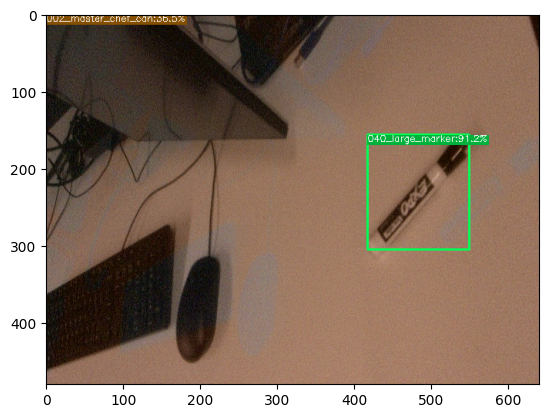

In [46]:
output = yolo_predictor.inference(img_resize)
out = vis_yolo(output[0], img_resize, classes, cls_conf=0.35)
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

In [9]:
gdrn_predictor = GdrnPredictor(
                    config_file_path=osp.join(PROJ_ROOT,"configs/gdrn/ycbv/convnext_a6_AugCosyAAEGray_BG05_mlL1_DMask_amodalClipBox_classAware_ycbv.py"),
                    ckpt_file_path=osp.join(PROJ_ROOT,"output/gdrn/ycbv/model_final_wo_optim.pth"),
                    # ckpt_file_path=osp.join(PROJ_ROOT,"output/gdrn/ycbv/model_tomato_soup_can.pth"),
                    camera_json_path=osp.join(PROJ_ROOT,"datasets/BOP_DATASETS/ycbv/camera_cmu.json"),
                    path_to_obj_models=osp.join(PROJ_ROOT,"datasets/BOP_DATASETS/ycbv/models")
)

[1109_050922@predictor_gdrn:602] optimizer_cfg: {'type': 'Ranger', 'lr': 0.0008, 'weight_decay': 0.01}


20231108_160924|core.utils.default_args_setup@123: Rank of current process: 0. World size: 1
20231108_160924|core.utils.default_args_setup@124: Environment info:
-------------------------------  ----------------------------------------------------------------------------------
sys.platform                     linux
Python                           3.8.10 (default, May 26 2023, 14:05:08) [GCC 9.4.0]
numpy                            1.24.1
detectron2                       0.6 @/home/meuli/gdrn_wkspc/.venv/lib/python3.8/site-packages/detectron2
Compiler                         GCC 9.4
CUDA compiler                    CUDA 11.6
detectron2 arch flags            6.1
DETECTRON2_ENV_MODULE            <not set>
PyTorch                          1.13.1+cu116 @/home/meuli/gdrn_wkspc/.venv/lib/python3.8/site-packages/torch
PyTorch debug build              False
torch._C._GLIBCXX_USE_CXX11_ABI  False
GPU available                    Yes
GPU 0                            Quadro P620 (arch=6.1)
Driver 

[1108_160924 d2.utils.env@41]: Using a generated random seed 25207176


Global seed set to 25207176
20231108_160924|core.utils.default_args_setup@162: Used mmcv backend: cv2
20231108_160925|timm.models.helpers@244: Loading pretrained weights from url (https://dl.fbaipublicfiles.com/convnext/convnext_base_1k_224_ema.pth)


[1108_160926 d2.checkpoint.detection_checkpoint@38]: [DetectionCheckpointer] Loading from /home/meuli/gdrn_wkspc/gdrnpp_bop2022/output/gdrn/ycbv/model_final_wo_optim.pth ...
[1108_160926 fvcore.common.checkpoint@150]: [Checkpointer] Loading from /home/meuli/gdrn_wkspc/gdrnpp_bop2022/output/gdrn/ycbv/model_final_wo_optim.pth ...


In [29]:
data_dict = gdrn_predictor.preprocessing(outputs=output, image=img_resize)

In [30]:
out_dict = gdrn_predictor.inference(data_dict)

In [31]:
poses = gdrn_predictor.postprocessing(data_dict, out_dict)

In [34]:
print(poses['040_large_marker'])

In [33]:
gdrn_imgs = gdrn_predictor.gdrn_visualization(batch=data_dict, out_dict=out_dict, image=img_resize)

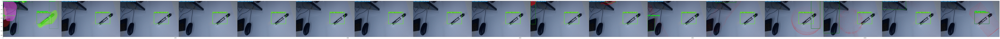

In [15]:
plt.figure(figsize=(200,20))
plt.imshow(gdrn_imgs)

In [16]:
img = cv2.imread(img_dir)
output = yolo_predictor.inference(img)
data_dict = gdrn_predictor.preprocessing(outputs=output, image=img)
out_dict = gdrn_predictor.inference(data_dict)
poses = gdrn_predictor.postprocessing(data_dict, out_dict)

NameError: name 'img_dir' is not defined